# Solar Radiation Prediction and Clustering




In [21]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, r2_score, classification_report, confusion_matrix
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

import warnings
warnings.filterwarnings("ignore")


## Part 1: Data Preprocessing



In [3]:
# Load the dataset
df = pd.read_csv("/content/drive/MyDrive/FWE 458/Lec21/SW_with_AOD.csv")
df.head()

,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA,SW_direct,SW_diffuse
0,24.936783,1.172892,2.440000,0.286546,2.021502,311.419861,959.085083,0.162,0.193,467.191650,300.820007
1,34.865055,1.626954,4.630000,0.468832,4.859887,308.713379,968.427551,0.155,0.169,264.900024,385.293335
2,27.330978,1.095007,2.030000,0.301414,5.278558,293.322052,988.040588,0.136,0.149,313.553314,321.538361
3,20.361732,1.126541,5.500000,0.377019,4.856422,321.498199,977.610229,0.156,0.179,143.902298,501.073639
4,13.433228,0.725452,0.736076,0.075378,0.644262,295.448975,882.321411,0.188,0.212,957.331665,79.003334


In [4]:
# Check for missing values
df.isnull().sum()

,0
SZA,0
AOD,0
COD,0
CLD_FRAC,0
UW,0
TO3,0
Pressure,0
BSA,0
WSA,0
SW_direct,0


In [5]:
# Create new columns
df["SW_total"] = df["SW_direct"] + df["SW_diffuse"]
df["SW_total_category"] = pd.qcut(df["SW_total"], q=4, labels=["Q1", "Q2", "Q3", "Q4"])
df.head()

,SZA,AOD,COD,CLD_FRAC,UW,TO3,Pressure,BSA,WSA,SW_direct,SW_diffuse,SW_total,SW_total_category
0,24.936783,1.172892,2.440000,0.286546,2.021502,311.419861,959.085083,0.162,0.193,467.191650,300.820007,768.011658,Q3
1,34.865055,1.626954,4.630000,0.468832,4.859887,308.713379,968.427551,0.155,0.169,264.900024,385.293335,650.193359,Q3
2,27.330978,1.095007,2.030000,0.301414,5.278558,293.322052,988.040588,0.136,0.149,313.553314,321.538361,635.091675,Q2
3,20.361732,1.126541,5.500000,0.377019,4.856422,321.498199,977.610229,0.156,0.179,143.902298,501.073639,644.975937,Q3
4,13.433228,0.725452,0.736076,0.075378,0.644262,295.448975,882.321411,0.188,0.212,957.331665,79.003334,1036.334999,Q4


### Pairplot Visualization

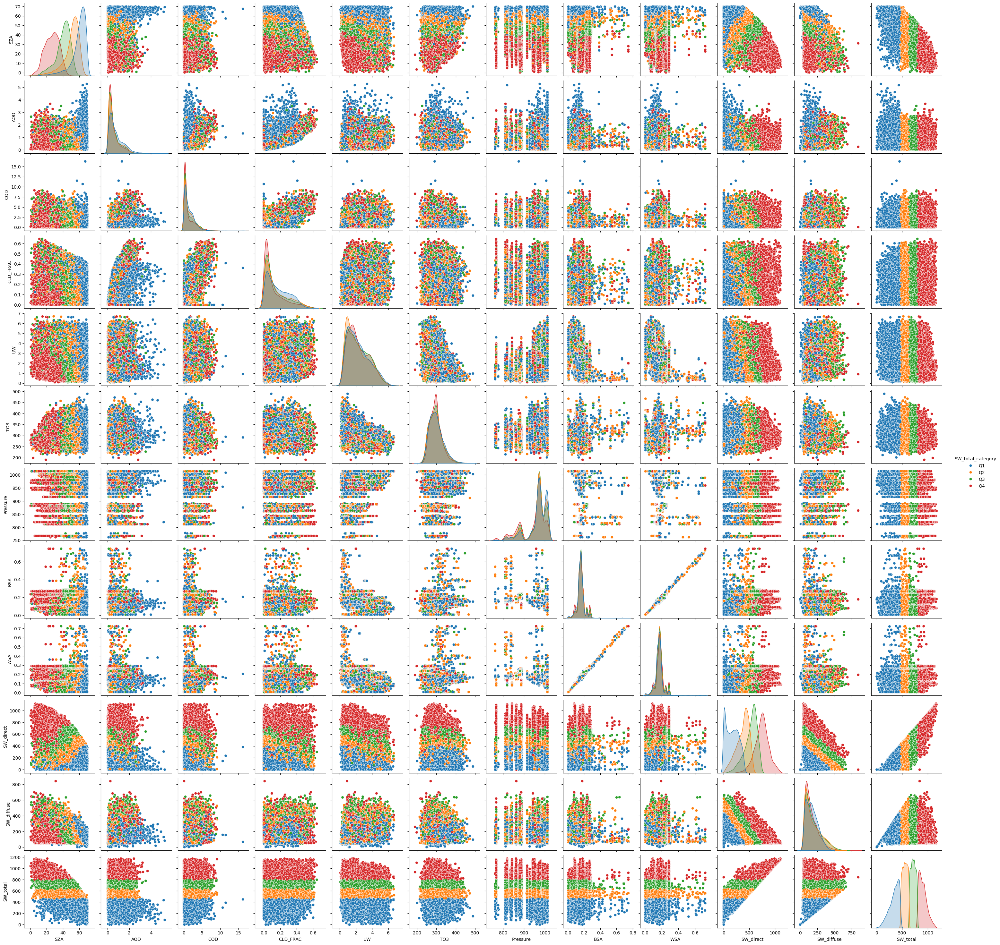

In [20]:
sns.pairplot(df, vars=["SZA", "AOD", "COD", "CLD_FRAC", "UW", "TO3", "Pressure", "BSA", "WSA",
                       "SW_direct", "SW_diffuse", "SW_total"], hue="SW_total_category")
# sns.pairplot(df, vars=["SW_direct", "SW_diffuse", "SW_total"], hue="SW_total_category")
plt.show()

### Normalize Input Features


In [7]:
input_features = ["SZA", "AOD", "COD", "CLD_FRAC", "UW", "TO3", "Pressure", "BSA", "WSA"]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[input_features])

## Part 2: Unsupervised Learning
### 2.1 K-Means Clustering

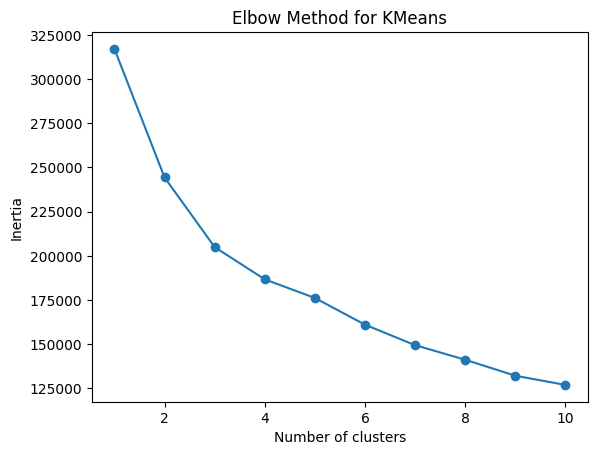

In [16]:
# Elbow Method
inertia = []
for k in range(1, 11):
    km = KMeans(n_clusters=k, random_state=100)
    km.fit(X_scaled)
    inertia.append(km.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for KMeans")
plt.show()

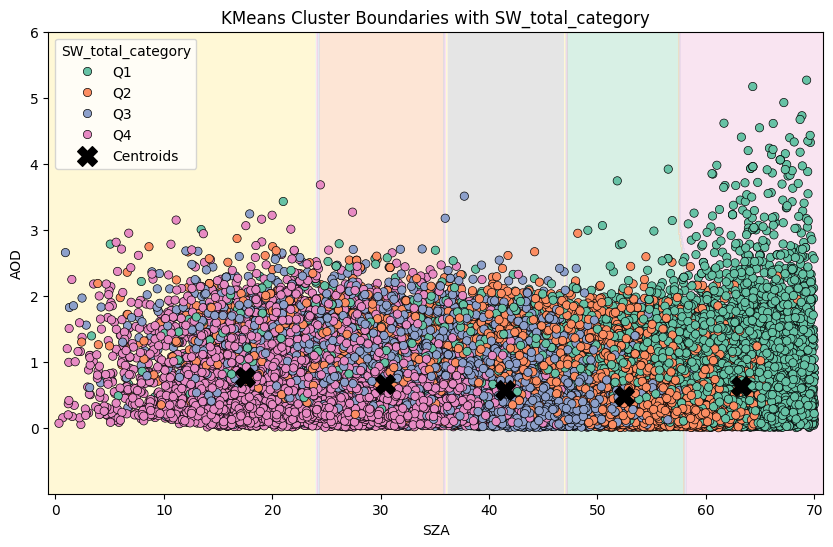

In [14]:
# Select the two features for visualization
X_2d = df[["SZA", "AOD"]].values

# Fit KMeans (reusing existing model or fit a new one if needed)
kmeans_2d = KMeans(n_clusters=5, random_state=100)
df['Cluster'] = kmeans_2d.fit_predict(X_2d)

# Create meshgrid for decision boundary
h = 0.5  # step size in the mesh
x_min, x_max = X_2d[:, 0].min() - 1, X_2d[:, 0].max() + 1
y_min, y_max = X_2d[:, 1].min() - 1, X_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# Predict cluster labels for each point in the meshgrid
Z = kmeans_2d.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot decision boundaries
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, cmap="Pastel2", alpha=0.5)

# Scatter plot color-coded by SW_total_category
sns.scatterplot(data=df, x="SZA", y="AOD", hue="SW_total_category", palette="Set2", edgecolor='k')

# Plot centroids
centroids = kmeans_2d.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='black', label='Centroids')

plt.title("KMeans Cluster Boundaries with SW_total_category")
plt.xlabel("SZA")
plt.ylabel("AOD")
plt.legend(title='SW_total_category')
plt.show()

### Analyze: By looking at the elbow curve, I choose 5 clusters as the optimal number. And I think ther KMeans algorithm did a great job separating data poitns for each category. I also tried n_clusters = 4, but the result was not good. With n_clusters = 5, I think the alignment is great. with the first two clusters mainly correspond to Q4, and the rest three clusters represernt Q3, Q2, and Q1, respectively.

## 2.2 Interpretation
1. KMeans determin each cluster mainly based on the intensity of SZA, with the higher SZA, the lower SW_Total. There is no clear pattern shown along the AOD axis.
2. The clusters are meaningful. We can verify that by looking at different reagions of the lot. First, the cluster in with low SZA and low AOD represents clear sky and high radiation conditions, which aligns with Q4, getting the most shortwave radiation. Then, clusters with high SZA usually represent hazy or dirty skies, aligning to Q1 and Q2 with less solar radiation.

## Part 3: Supervised Learning
### 3.1 Regression – Predicting SW_total

In [23]:
X = df[input_features]
y = df["SW_total"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

In [27]:
# Decision Tree
dt = DecisionTreeRegressor(random_state=100)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

# Random Forest
rf = RandomForestRegressor(random_state=100)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

In [30]:
# Evaluation Function
def evaluate_regression(y_true, y_pred, name):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    print(f"{name} — RMSE: {rmse:.2f}, R2: {r2:2f}")

evaluate_regression(y_test, y_pred_dt, "Decision Tree")
evaluate_regression(y_test, y_pred_rf, "Random Forest")

Decision Tree — RMSE: 140.18, R2:                 0.601211
Random Forest — RMSE: 99.05, R2:                 0.800892


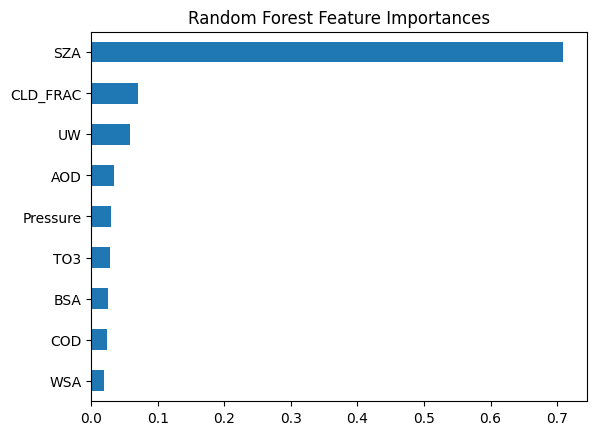

In [31]:
# Feature Importance
pd.Series(rf.feature_importances_, index=input_features).sort_values().plot(kind='barh')
plt.title("Random Forest Feature Importances")
plt.show()

## Interpretation: Solar Zenith Angle is the most important feature when predicting solar radiation. This makes sense. Since SZA measures the angle between the sun and the vertical direction, it directly affects the distance that the sunlight travels through the atmosphere, then incluences the solar radiation that the Earth's surface recieves.

## Cloud fractions and Water vapor column are the second and third important features, but way less influence than SZA. They are not directly relevant to the Sun, they contribute to the blocking and absorption of the sunlight. The rest features don't contribute too much to the model prediction.

### Part 4: Classification – Predicting SW_total_category

In [32]:
Xc = df[input_features]
yc = df["SW_total_category"]
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc, yc, test_size=0.2, random_state=100)

In [33]:
# KNN Classifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(Xc_train, yc_train)
y_pred_knn = knn.predict(Xc_test)

# Gaussian Naive Bayes
gnb = GaussianNB()
gnb.fit(Xc_train, yc_train)
y_pred_gnb = gnb.predict(Xc_test)


K-Nearest Neighbors Classification Report:
              precision    recall  f1-score   support

          Q1       0.74      0.70      0.72      1764
          Q2       0.53      0.52      0.53      1746
          Q3       0.57      0.58      0.57      1760
          Q4       0.76      0.79      0.77      1775

    accuracy                           0.65      7045
   macro avg       0.65      0.65      0.65      7045
weighted avg       0.65      0.65      0.65      7045



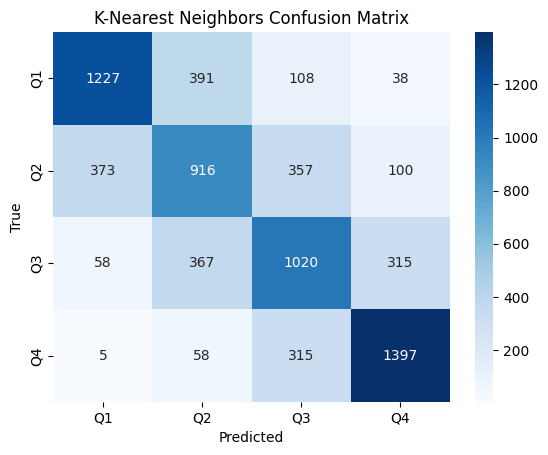


Gaussian Naive Bayes Classification Report:
              precision    recall  f1-score   support

          Q1       0.78      0.71      0.74      1764
          Q2       0.56      0.61      0.58      1746
          Q3       0.54      0.54      0.54      1760
          Q4       0.76      0.77      0.77      1775

    accuracy                           0.66      7045
   macro avg       0.66      0.66      0.66      7045
weighted avg       0.66      0.66      0.66      7045



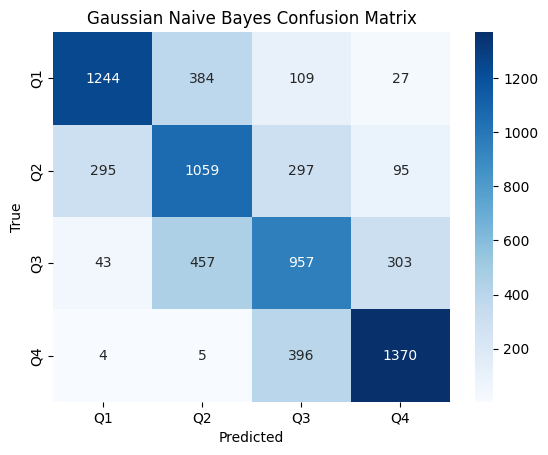

In [34]:
# Classification Evaluation
def evaluate_classification(y_true, y_pred, name):
    print(f"\n{name} Classification Report:")
    print(classification_report(y_true, y_pred))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=["Q1", "Q2", "Q3", "Q4"],
                yticklabels=["Q1", "Q2", "Q3", "Q4"])
    plt.title(f"{name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

evaluate_classification(yc_test, y_pred_knn, "K-Nearest Neighbors")
evaluate_classification(yc_test, y_pred_gnb, "Gaussian Naive Bayes")

## Discussion: GNB performs slightly better than KNN. GNB has slightly higher overall accuracy, and macro avewrage f1 score. In terms of each class, GNB outperforms KNN in Q1 and Q2, which may be hard classes to categorize. KNN was slightly better in Q3, and the performance are similar in Q4. Overall, GNB might be generalizing better across the classes

## Part 4: Reflection and Recommendation

### There are many input features that we can use to predict total shortwave radiation. Among these, Solar Zenith Angle stands out and becomes the most relevant feature in the prediction. It is much important than other variables. This may because SZA directly related to the sunlight, which has directly impact on the solar radiation that the Earth's surface recieved. Then, I did KMeans clustering analysis and plot the result against SZA and AOD. I use 5 clusters and it can separate different SW_total_category really well. There is a clear pattern that the clusters are distributed along the SZA axis, which means that SZA contributes mostly to the SW_total_category. This algins with my feature importance analysis. SW_total_category decreases as SZA increases. In the solar radiation prediction task, Random Forest performed much better than Decision Trees. This makes sense because RF is like ensembled trees that uses bagging and majority votes to reduce overfitting. That may be one reason that it performed better on the testing dataset. Thus, I would recomment using Random Forest for this task.